###### Exercise

Dataset : clean_train_tweet.csv

we need to perform data cleaning and preprocessing.Remove the following noises from the dataset. Understand the dataset. Put the preprocessed data into a new column.:

Twitter handlers (@users)
urls and links
punctuations
numbers
any non-ASCII Characters
short words
perform stemming/lemmatization after removing all noises from the dataset.
Note: Remove the noises in the given order to ease your data cleaning. For example, if you remove punctuations first, you will not be ablke to remove Twitter handlers, urls and links easily.

Once the dataset has been cleaned and preprocessed, export the data to a csv file, conserving the original label of each tweets by running the following code:

### A DataFrame is a two-dimensional tabular data structure, like a table in a database or an Excel spreadsheet

### Common Uses of a Pandas DataFrame:

###### Data Loading:
- Importing datasets from files (CSV, Excel, SQL databases).

###### Data Analysis:
- Performing statistical operations, filtering data, and grouping by specific criteria.

###### Data Cleaning:
- Handling missing values, renaming columns, or removing duplicates.

###### Data Visualization:
- Preparing data for plots and charts.

###### Integration:
- Converting data into formats suitable for machine learning libraries like Scikit-learn or TensorFlow.

##### Key DataFrame Methods:
- .head(): Displays the first few rows of the DataFrame.
- .tail(): Displays the last few rows.
- .info(): Provides a summary of the DataFrame.
- .describe(): Generates descriptive statistics.
- .iloc[] / .loc[]: Indexing and selecting rows and columns.

In [1]:
import pandas as pd
import re

df = pd.read_csv('train_tweet.csv') #load CSV into Pandas DF
print(df) #Displaying the Data

          id                                              tweet
0          1   @user when a father is dysfunctional and is s...
1          2  @user @user thanks for #lyft credit i can't us...
2          3                                bihday your majesty
3          4  #model   i love u take with u all the time in ...
4          5             factsguide: society now    #motivation
...      ...                                                ...
31957  31958  ate @user isz that youuu?ðððððð...
31958  31959    to see nina turner on the airwaves trying to...
31959  31960  listening to sad songs on a monday morning otw...
31960  31961  @user #sikh #temple vandalised in in #calgary,...
31961  31962                   thank you @user for you follow  

[31962 rows x 2 columns]


In [5]:
df.head() #preview the first 5 rows 

,id,tweet
0,1,@user when a father is dysfunctional and is s...
1,2,@user @user thanks for #lyft credit i can't us...
2,3,bihday your majesty
3,4,#model i love u take with u all the time in ...
4,5,factsguide: society now #motivation


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   tweet   31962 non-null  object
dtypes: int64(1), object(1)
memory usage: 499.5+ KB


The .info() method provides a concise summary of the DataFrame, including:
- Number of entries (rows).
- Number of columns.
- Column names and their data types.
- Number of non-null (non-missing) values in each column.
- Memory usage of the DataFrame.

In [7]:
#better viewing
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

df

,id,tweet
0,1,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run
1,2,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked
2,3,bihday your majesty
3,4,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦
4,5,factsguide: society now #motivation
5,6,[2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo
6,7,@user camping tomorrow @user @user @user @user @user @user @user dannyâ¦
7,8,the next school year is the year for exams.ð¯ can't think about that ð­ #school #exams #hate #imagine #actorslife #revolutionschool #girl
8,9,we won!!! love the land!!! #allin #cavs #champions #cleveland #clevelandcavaliers â¦
9,10,@user @user welcome here ! i'm it's so #gr8 !


## Sentiment Analysis

#### Explanation of Regex Patterns:

###### Remove Mentions:

- Pattern: @\w+
- Matches @ followed by word characters (letters, digits, or underscores).

###### Remove Hashtags (Keep Text):

- Pattern: #(\w+)
- Matches # followed by word characters, retaining the text (e.g., #amazing → amazing).

###### Remove URLs:

- Pattern: http\S+|www\S+|https\S+
- Matches URLs starting with http, www, or https.

###### Remove Numbers:

- Pattern: \d+
- Matches one or more digits.

###### Remove Non-ASCII Characters:

- Pattern: [^\x00-\x7F]+
- Matches any character outside the ASCII range.

###### Remove Extra Spaces:

- Pattern: \s+
- Matches one or more whitespace characters and replaces them with a single space.

### Example Remove by one 

- df["cleaned_tweet"] = [re.sub(r"[@]\w+", "", data)for data in df["tweet"]]


In [17]:
# Function to clean a single tweet
def clean_tweet(data):
    
    # Remove mentions @
    data = re.sub(r'@\w+', '', data)
    
    # Remove numbers
    data = re.sub(r'\d+', '', data)
    
    # Remove hashtags (keep text after #)
    data = re.sub(r'#(\w+)', r'\1', data)
    
    # Remove URLs
    data = re.sub(r'http\S+|www\S+|https\S+', '', data)
    
    # Remove non-ASCII characters
    data = re.sub(r'[^\x00-\x7F]+', '', data)
    
    # Remove extra spaces
    data = re.sub(r'\s+', ' ', data).strip()
    
    return data

# Apply the cleaning function to the 'tweet' column
df["cleaned_tweet"] = df["tweet"].apply(clean_tweet)

# Display the cleaned DataFrame
df.head()

,id,tweet,cleaned_tweet
0,1,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. run
1,2,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,thanks for lyft credit i can't use cause they don't offer wheelchair vans in pdx. disapointed getthanked
2,3,bihday your majesty,bihday your majesty
3,4,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model i love u take with u all the time in ur!!!
4,5,factsguide: society now #motivation,factsguide: society now motivation


## Generate Graph from TextBlob

In [19]:
from textblob import TextBlob

def assigned_polarity(x):
    
    return TextBLob(x).sentiment.polarity

df["polarity"] = df["cleaned_tweet"].apply(lambda x :TextBlob(x).sentiment.polarity)
df.head()

,id,tweet,cleaned_tweet,polarity
0,1,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. run,-0.500000
1,2,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,thanks for lyft credit i can't use cause they don't offer wheelchair vans in pdx. disapointed getthanked,0.200000
2,3,bihday your majesty,bihday your majesty,0.000000
3,4,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model i love u take with u all the time in ur!!!,0.976562
4,5,factsguide: society now #motivation,factsguide: society now motivation,0.000000


In [20]:
def assigned_label(x):
    if x > 0.0:
        return "Positive"
    elif x < 0:
        return "Negative"
    else:
        return "Neutral"

df["label"] = df["polarity"].apply(lambda x :assigned_label(x))
df.head()

,id,tweet,cleaned_tweet,polarity,label
0,1,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. run,-0.500000,Negative
1,2,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,thanks for lyft credit i can't use cause they don't offer wheelchair vans in pdx. disapointed getthanked,0.200000,Positive
2,3,bihday your majesty,bihday your majesty,0.000000,Neutral
3,4,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model i love u take with u all the time in ur!!!,0.976562,Positive
4,5,factsguide: society now #motivation,factsguide: society now motivation,0.000000,Neutral


In [21]:
#.value_counts()
df["label"].value_counts()

Positive    16008
Neutral     11175
Negative     4779
Name: label, dtype: int64

In [22]:
df["label"].value_counts().index

Index(['Positive', 'Neutral', 'Negative'], dtype='object')

Positive    16008
Neutral     11175
Negative     4779
Name: label, dtype: int64


Text(0, 0.5, 'Count')

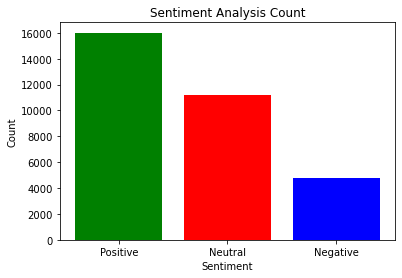

In [23]:
import matplotlib.pyplot as plt

sentiment_counts = df["label"].value_counts()
print(sentiment_counts)

plt.bar(sentiment_counts.index, sentiment_counts.values, color = ['green', 'red', 'blue'])

plt.title("Sentiment Analysis Count")
plt.xlabel("Sentiment")
plt.ylabel("Count")

## Generate WordCloud

In [24]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [34]:
!pip install nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sityr\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sityr\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


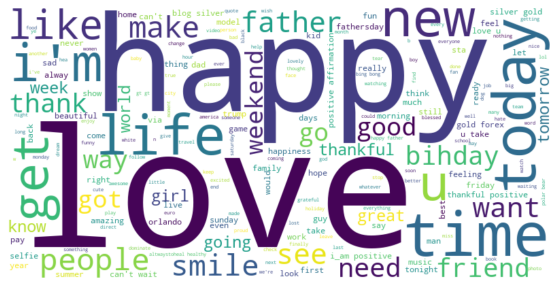

In [37]:
import nltk
from nltk.corpus import stopwords

# Download stopwords if not already downloaded
nltk.download('stopwords')

# Create the stopword list
stop_word_list = stopwords.words('english')
additional_stopword = ["day", "one", "ur", "amp"]
new_stopword = stop_word_list + additional_stopword

# Combine all text from the 'cleaned_tweet' column
text = " ".join(df["cleaned_tweet"].astype(str))

# Generate the word cloud
wordcloud = WordCloud(
    width=800, 
    height=400, 
    background_color='white', 
    stopwords=new_stopword  # Correct parameter name
).generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # No axis to be displayed
plt.show()